### Повнозв'язні мережі. Вирішіть завдання класифікації даних, з якими працювали в Лабораторній №1

In [16]:
import math
import shutil

import keras
from keras.src.applications.efficientnet import EfficientNetB0
from keras.src.callbacks import EarlyStopping, History, ModelCheckpoint
from keras.src.utils import to_categorical
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
import pandas as pd
from keras import Sequential, Input
from keras.src.layers import Dense
from matplotlib import pyplot as plt

In [2]:
df = pd.read_csv("../train.csv")
df

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


In [3]:
x = df.drop('price_range', axis=1)
y = to_categorical(df['price_range'])

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1)

scaler = StandardScaler()
scaler.fit(x_train)

scaled_x_train = scaler.transform(x_train)
scaled_x_test = scaler.transform(x_test)

to_test = {
    'layers': [[128, 64, 32, 16, 4], [256, 128, 32, 16, 4], [1024, 512, 64, 32, 16, 4]],
    'activation': ['relu', 'leaky_relu'],
    'optimizer': ['adam', 'nadam', 'rmsprop']
}


In [4]:
scaled_x_train, validation_data_x, y_train, validation_data_y = train_test_split(scaled_x_train, y_train, test_size=0.2)

all_epochs = []
all_losses = []
all_val_losses = []
all_accuracies = []
i = 0
mx = None
for layer in to_test['layers']:
    for activation in to_test['activation']:
        for optimizer in to_test['optimizer']:
            model = Sequential()
            model.add(Input((x.shape[1],)))
            for l in layer:
                model.add(Dense(l, activation=activation if l != 4 else 'softmax'))
            model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
            epoch_train = model.fit(scaled_x_train,
                                    y_train,
                                    validation_data=(validation_data_x, validation_data_y),
                                    epochs=100,
                                    verbose=0,
                                    batch_size=32,
                                    callbacks=EarlyStopping(monitor='val_loss', patience=5),
                                    validation_split=0.2)
            history_dict = epoch_train.history
            all_losses.append(history_dict["loss"])
            all_val_losses.append(history_dict["val_loss"])
            all_epochs.append(range(1, len(history_dict["loss"]) + 1))
            acc = model.evaluate(scaled_x_test, y_test, verbose=0)[1]
            all_accuracies.append(acc)
            if mx is None:
                mx = [acc, i, layer[0], activation, optimizer]
            else:
                mx = [acc, i, layer[0], activation, optimizer] if mx[0] < acc else mx
            i += 1

I0000 00:00:1735292121.379621  342425 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5558 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3070 Ti, pci bus id: 0000:2d:00.0, compute capability: 8.6


Epoch 1/100


I0000 00:00:1735292123.294743  342650 service.cc:148] XLA service 0x7fdb58005a50 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1735292123.294885  342650 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce RTX 3070 Ti, Compute Capability 8.6
2024-12-27 11:35:23.331741: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1735292123.459516  342650 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1735292125.193433  342650 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


45/45 - 4s - 92ms/step - accuracy: 0.3229 - loss: 1.3470 - val_accuracy: 0.3778 - val_loss: 1.2363
Epoch 2/100
45/45 - 0s - 4ms/step - accuracy: 0.5986 - loss: 1.0098 - val_accuracy: 0.7750 - val_loss: 0.7191
Epoch 3/100
45/45 - 0s - 4ms/step - accuracy: 0.8472 - loss: 0.4533 - val_accuracy: 0.8694 - val_loss: 0.3190
Epoch 4/100
45/45 - 0s - 4ms/step - accuracy: 0.9333 - loss: 0.2214 - val_accuracy: 0.9139 - val_loss: 0.2210
Epoch 5/100
45/45 - 0s - 4ms/step - accuracy: 0.9639 - loss: 0.1327 - val_accuracy: 0.9083 - val_loss: 0.2096
Epoch 6/100
45/45 - 0s - 4ms/step - accuracy: 0.9667 - loss: 0.1035 - val_accuracy: 0.9083 - val_loss: 0.2390
Epoch 7/100
45/45 - 0s - 4ms/step - accuracy: 0.9806 - loss: 0.0704 - val_accuracy: 0.9222 - val_loss: 0.1964
Epoch 8/100
45/45 - 0s - 4ms/step - accuracy: 0.9812 - loss: 0.0611 - val_accuracy: 0.9083 - val_loss: 0.2265
Epoch 9/100
45/45 - 0s - 4ms/step - accuracy: 0.9882 - loss: 0.0479 - val_accuracy: 0.9222 - val_loss: 0.1970
Epoch 10/100
45/45 - 

2024-12-27 11:35:54.546781: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_383', 68 bytes spill stores, 72 bytes spill loads

2024-12-27 11:35:54.643094: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_383', 24 bytes spill stores, 24 bytes spill loads



45/45 - 5s - 102ms/step - accuracy: 0.5160 - loss: 1.0425 - val_accuracy: 0.8139 - val_loss: 0.6333
Epoch 2/100
45/45 - 0s - 4ms/step - accuracy: 0.8868 - loss: 0.4045 - val_accuracy: 0.8972 - val_loss: 0.2536
Epoch 3/100
45/45 - 0s - 4ms/step - accuracy: 0.9333 - loss: 0.2028 - val_accuracy: 0.9333 - val_loss: 0.2006
Epoch 4/100
45/45 - 0s - 4ms/step - accuracy: 0.9646 - loss: 0.1223 - val_accuracy: 0.9250 - val_loss: 0.1870
Epoch 5/100
45/45 - 0s - 4ms/step - accuracy: 0.9646 - loss: 0.0975 - val_accuracy: 0.9333 - val_loss: 0.1945
Epoch 6/100
45/45 - 0s - 4ms/step - accuracy: 0.9785 - loss: 0.0759 - val_accuracy: 0.9083 - val_loss: 0.2039
Epoch 7/100
45/45 - 0s - 4ms/step - accuracy: 0.9833 - loss: 0.0582 - val_accuracy: 0.9111 - val_loss: 0.2289
Epoch 8/100
45/45 - 0s - 4ms/step - accuracy: 0.9889 - loss: 0.0435 - val_accuracy: 0.8861 - val_loss: 0.2704
Epoch 9/100
45/45 - 0s - 4ms/step - accuracy: 0.9903 - loss: 0.0338 - val_accuracy: 0.9306 - val_loss: 0.1993
Epoch 1/100
45/45 - 

2024-12-27 11:36:23.558785: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_247_0', 88 bytes spill stores, 120 bytes spill loads

2024-12-27 11:36:23.974417: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_247', 220 bytes spill stores, 220 bytes spill loads

2024-12-27 11:36:23.986044: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_436', 68 bytes spill stores, 72 bytes spill loads

2024-12-27 11:36:24.408658: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_436', 24 bytes spill stores, 24 bytes spill loads

2024-12-27 11:36:24.422260: I external/local_xla/xla/stream

45/45 - 6s - 130ms/step - accuracy: 0.6750 - loss: 0.7318 - val_accuracy: 0.8694 - val_loss: 0.3115
Epoch 2/100
45/45 - 0s - 5ms/step - accuracy: 0.8993 - loss: 0.2319 - val_accuracy: 0.8806 - val_loss: 0.3478
Epoch 3/100
45/45 - 0s - 5ms/step - accuracy: 0.9167 - loss: 0.1963 - val_accuracy: 0.8972 - val_loss: 0.2169
Epoch 4/100
45/45 - 0s - 5ms/step - accuracy: 0.9528 - loss: 0.1227 - val_accuracy: 0.9000 - val_loss: 0.2367
Epoch 5/100
45/45 - 0s - 5ms/step - accuracy: 0.9674 - loss: 0.0759 - val_accuracy: 0.9139 - val_loss: 0.2554
Epoch 6/100
45/45 - 0s - 5ms/step - accuracy: 0.9604 - loss: 0.1159 - val_accuracy: 0.8778 - val_loss: 0.3052
Epoch 7/100
45/45 - 0s - 4ms/step - accuracy: 0.9694 - loss: 0.0786 - val_accuracy: 0.7944 - val_loss: 0.7101
Epoch 8/100
45/45 - 0s - 4ms/step - accuracy: 0.9250 - loss: 0.1902 - val_accuracy: 0.8583 - val_loss: 0.4232
Epoch 1/100
45/45 - 3s - 74ms/step - accuracy: 0.5632 - loss: 0.9942 - val_accuracy: 0.8361 - val_loss: 0.5050
Epoch 2/100
45/45 -

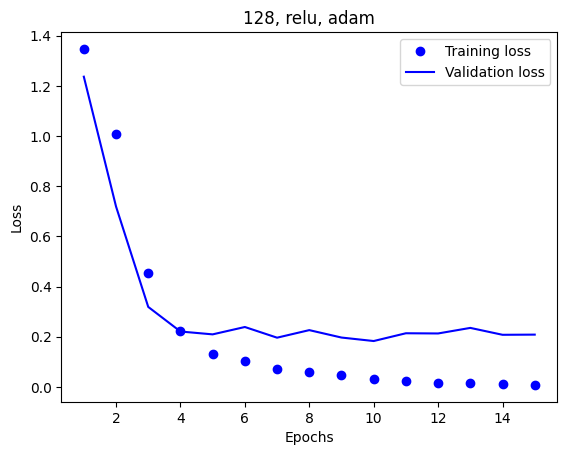

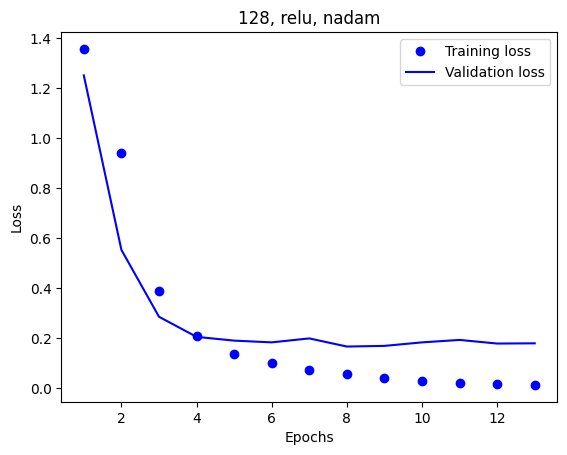

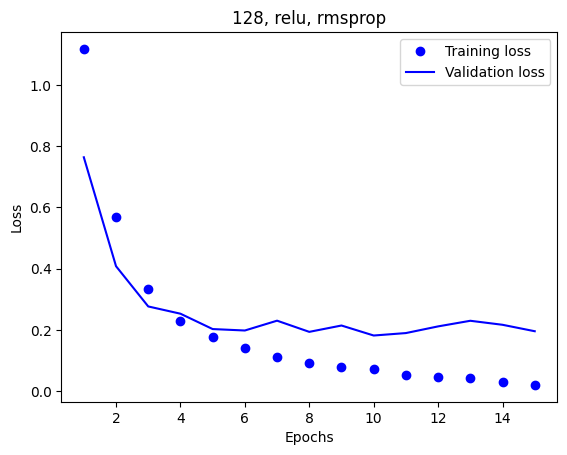

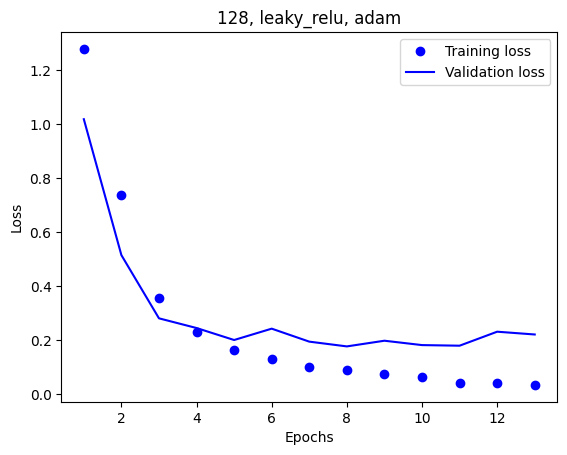

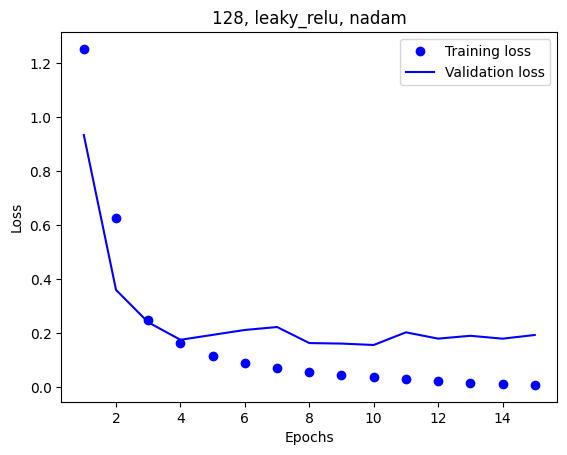

...

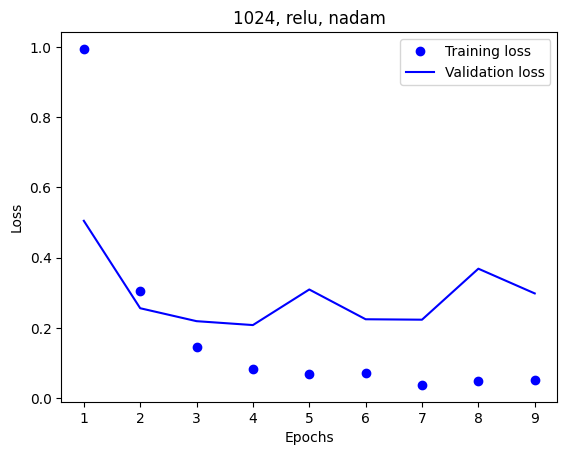

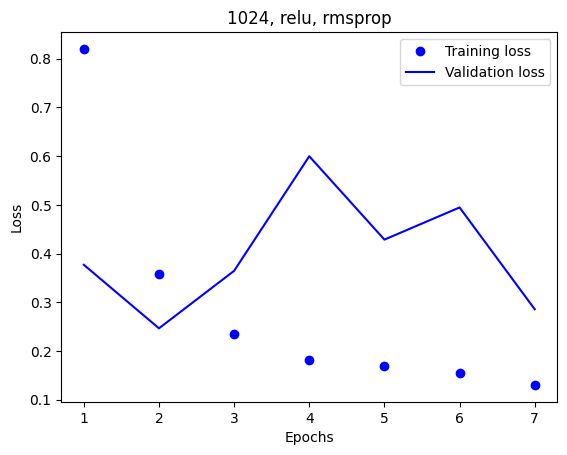

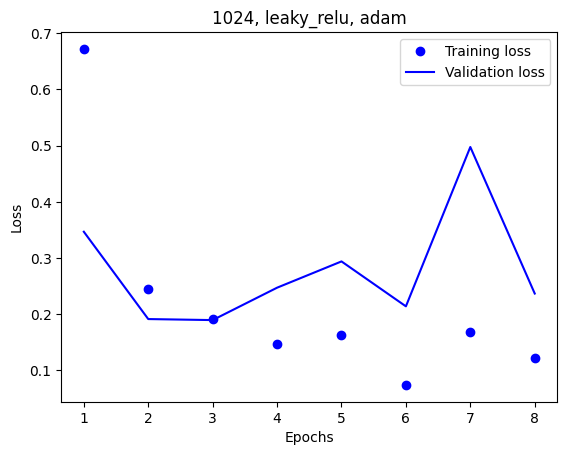

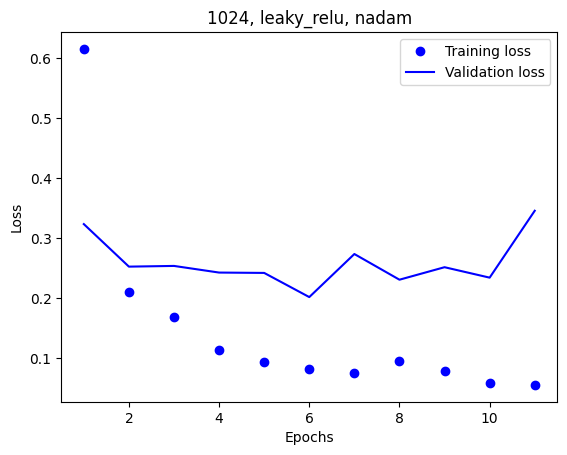

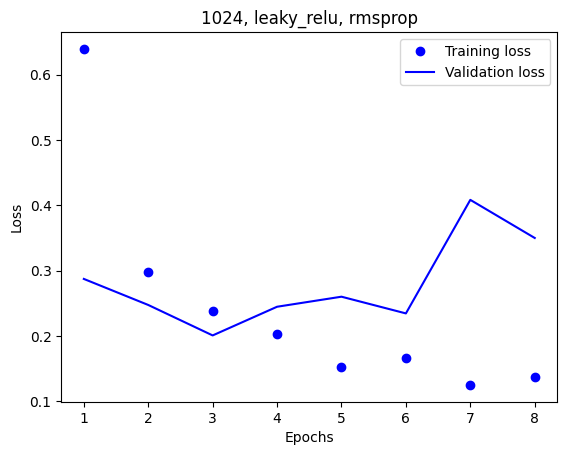

In [5]:
i = 0
naming = []
def show_history_plot(history_dict):
    loss_values = history_dict["loss"]
    val_loss_values = history_dict["val_loss"]
    epochs = range(1, len(loss_values) + 1)
    plt.plot(epochs, loss_values, "bo", label="Training loss")
    plt.plot(epochs, val_loss_values, "b", label="Validation loss")
    plt.title("Training and validation loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()
for layer in to_test['layers']:
    for activation in to_test['activation']:
        for optimizer in to_test['optimizer']:
            loss_values = all_losses[i]
            val_loss_values = all_val_losses[i]
            epochs = range(1, len(loss_values) + 1)
            plt.plot(epochs, loss_values, "bo", label="Training loss")
            plt.plot(epochs, val_loss_values, "b", label="Validation loss")
            plt.title(f'{layer[0]}, {activation}, {optimizer}')
            plt.xlabel("Epochs")
            plt.ylabel("Loss")
            plt.legend()
            plt.show()
            i = i + 1
            naming.append([layer[0], activation, optimizer])

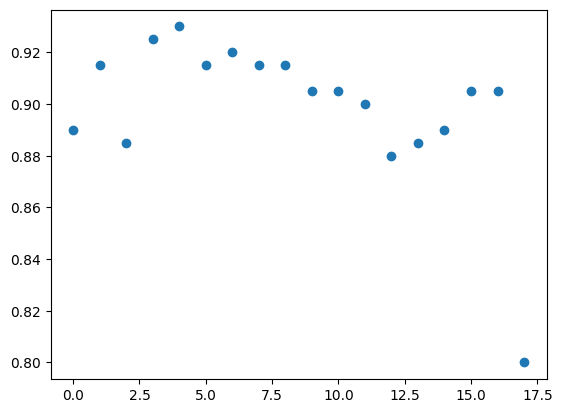

[0.9300000071525574, 4, 128, 'leaky_relu', 'nadam']


[[128, 'relu', 'adam'],
 [128, 'relu', 'nadam'],
 [128, 'relu', 'rmsprop'],
 [128, 'leaky_relu', 'adam'],
 [128, 'leaky_relu', 'nadam'],
 [128, 'leaky_relu', 'rmsprop'],
 [256, 'relu', 'adam'],
 [256, 'relu', 'nadam'],
 [256, 'relu', 'rmsprop'],
 [256, 'leaky_relu', 'adam'],
 [256, 'leaky_relu', 'nadam'],
 [256, 'leaky_relu', 'rmsprop'],
 [1024, 'relu', 'adam'],
 [1024, 'relu', 'nadam'],
 [1024, 'relu', 'rmsprop'],
 [1024, 'leaky_relu', 'adam'],
 [1024, 'leaky_relu', 'nadam'],
 [1024, 'leaky_relu', 'rmsprop']]

In [6]:
import numpy as np

x_plt = np.arange(0, len(all_accuracies), 1)
plt.scatter(x_plt, np.array(all_accuracies))
plt.show()
print(mx)
naming

### Висновок: relu/leaky_relu + adam/nadam + 128/256 neurons max == SVN + GridSearch (флуктуація 2-3%)

### Convolutional Neural Networks

In [7]:
import os, shutil

df = pd.read_csv('Training_set.csv')

df_cp = df[df['label'].isin(df['label'].value_counts().head(5).index)]
# filenames = df[~df['filename'].isin(df_cp['filename'])]['filename'].apply(lambda d: os.remove(f'train/{d}'))
df = df_cp
df.reset_index(drop=True, inplace=True)
df.insert(0, 'encoded', LabelEncoder().fit_transform(df['label']))

#df[['filename', 'encoded']].apply(lambda im: shutil.move(f'train/{im["filename"]}', f'train/{im["encoded"]}/{im[0]}.jpg'), axis=1)
#df[['filename', 'encoded']].apply(lambda x: shutil.move(f'train/{x["encoded"]}/{x["filename"]}.jpg', f'train/{x["encoded"]}/{x["filename"]}'), axis=1)

df['fullpath'] = 'train/' + df['encoded'].astype(str) + '/' + df['filename']

df

,encoded,filename,label,fullpath
0,1,Image_3.jpg,BROWN SIPROETA,train/1/Image_3.jpg
1,1,Image_9.jpg,BROWN SIPROETA,train/1/Image_9.jpg
2,0,Image_30.jpg,ATALA,train/0/Image_30.jpg
3,3,Image_53.jpg,SCARCE SWALLOW,train/3/Image_53.jpg
4,3,Image_59.jpg,SCARCE SWALLOW,train/3/Image_59.jpg
...,...,...,...,...
529,1,Image_6467.jpg,BROWN SIPROETA,train/1/Image_6467.jpg
530,0,Image_6469.jpg,ATALA,train/0/Image_6469.jpg
531,0,Image_6482.jpg,ATALA,train/0/Image_6482.jpg
532,2,Image_6496.jpg,MOURNING CLOAK,train/2/Image_6496.jpg


### From scratch

Found 534 files belonging to 5 classes.
Using 428 files for training.
Using 106 files for validation.


2024-12-27 11:36:54.486657: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2024-12-27 11:36:55.264095: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


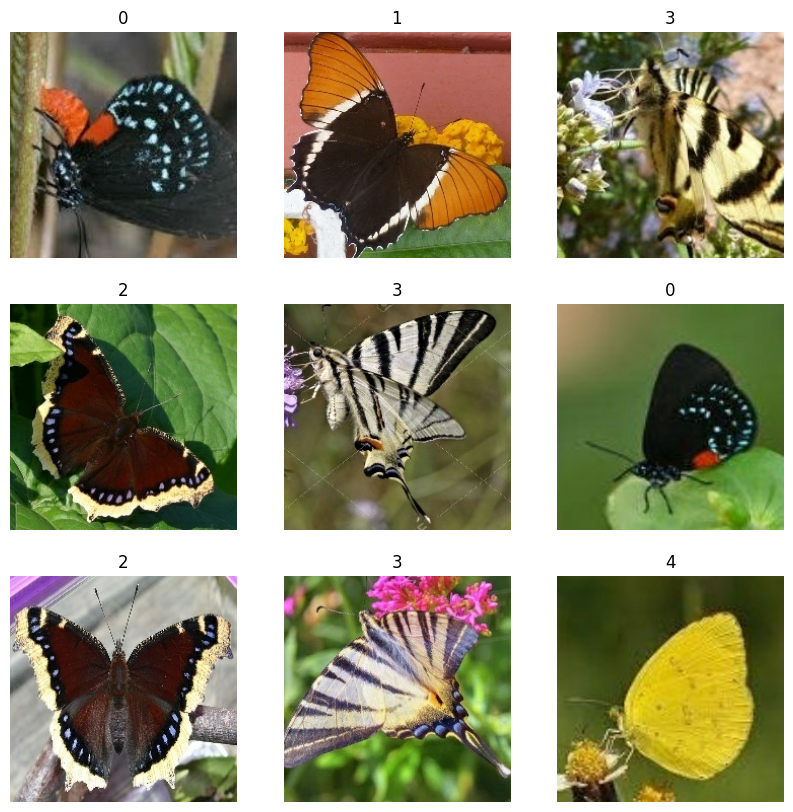

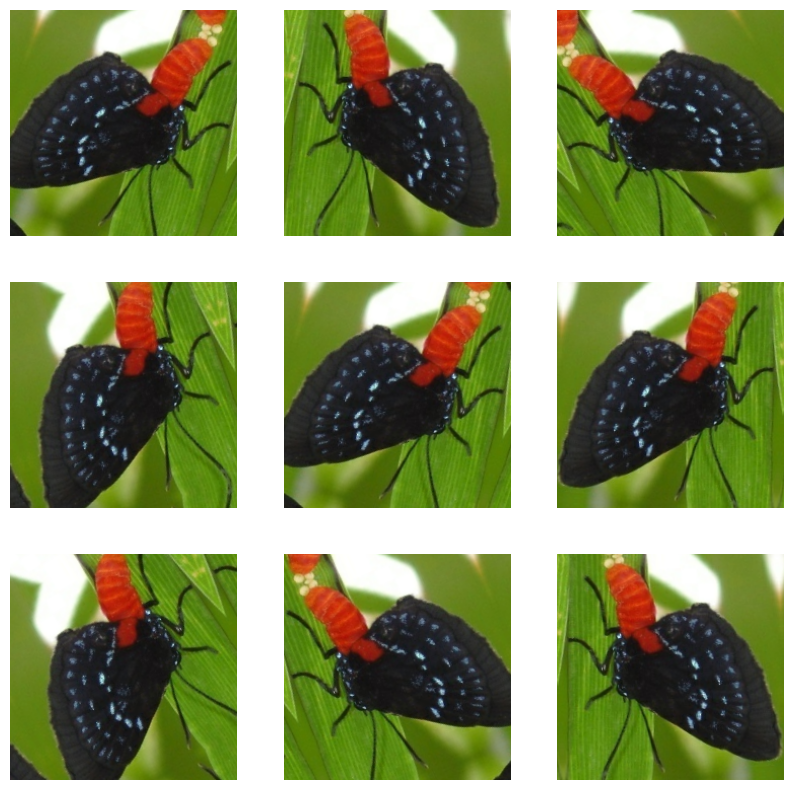

In [8]:
from keras.api import layers

batch = 32

train_ds, val_ds = keras.utils.image_dataset_from_directory(
    'train',
    batch_size=batch,
    subset='both',
    validation_split=0.2,
    seed=123,
    image_size=(224, 224)
)

data_augmentation_layers = [
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
]

def data_augmentation(images):
    for layer in data_augmentation_layers:
        images = layer(images)
    return images

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(np.array(images[i]).astype("uint8"))
        plt.title(int(labels[i]))
        plt.axis("off")

plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
    for i in range(9):
        augmented_images = data_augmentation(images)
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(np.array(augmented_images[0]).astype("uint8"))
        plt.axis("off")

In [9]:
def create_model():
    inputs = layers.Input(shape=(224, 224, 3))

    x = layers.Rescaling(1./255)(inputs)
    x = layers.Conv2D(32, strides=1, padding='same', kernel_size=3)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    for size in [64, 128, 256, 512, 1024, 2048]:
        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)
        x = layers.Conv2D(size, strides=1, padding='same', kernel_size=3)(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)

    x = layers.GlobalAveragePooling2D()(x)

    x = layers.Dropout(0.25)(x)
    outputs = layers.Dense(5, activation='softmax')(x)

    return keras.Model(inputs=inputs, outputs=outputs)

In [10]:
model_50 = create_model()
model_300 = create_model()
model_50.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model_300.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

history_50 = model_50.fit(x=train_ds, validation_data=val_ds, epochs=50, verbose=0, callbacks=[ModelCheckpoint("butterflies_50_epochs.keras")])
history_300 = model_300.fit(x=train_ds, validation_data=val_ds, epochs=300, verbose=0, callbacks=[ModelCheckpoint("butterflies_300_epochs.keras")])

2024-12-27 11:37:01.725191: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:306] Allocator (GPU_0_bfc) ran out of memory trying to allocate 8.91GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-12-27 11:37:08.913738: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:306] Allocator (GPU_0_bfc) ran out of memory trying to allocate 8.67GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-12-27 11:37:13.402196: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_256', 4 bytes spill stores, 4 bytes spill loads

2024-12-27 11:37:13.497531: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled 

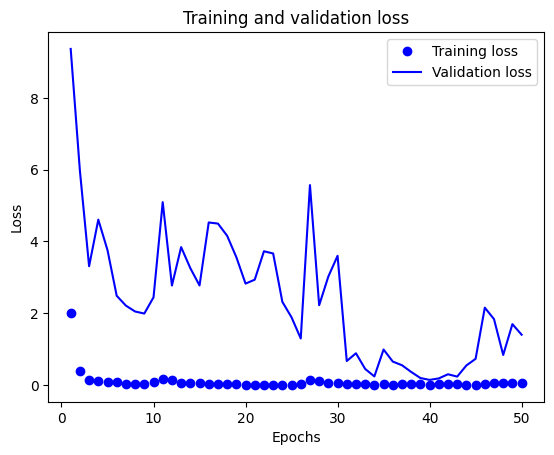

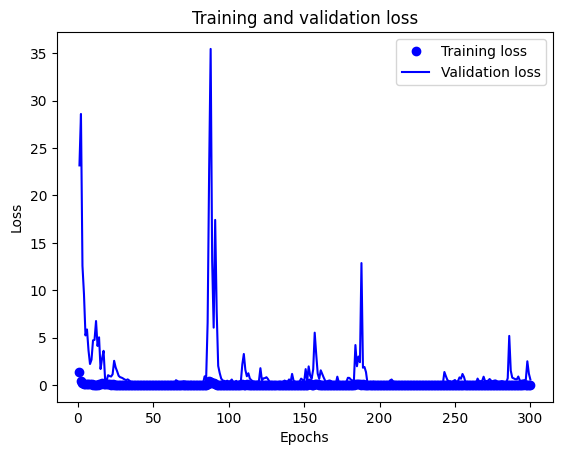

In [11]:
show_history_plot(history_50.history)
show_history_plot(history_300.history)

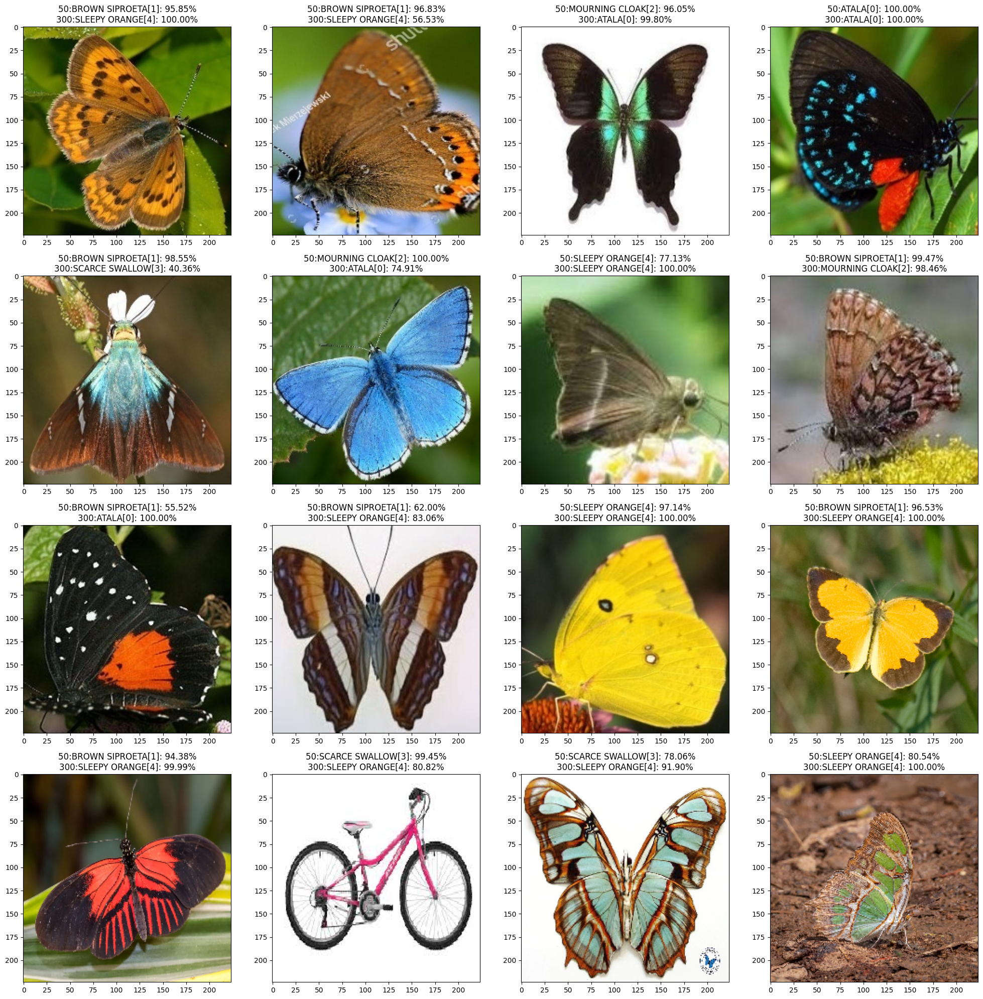

In [15]:
imgs = os.listdir('test')
_, axes = plt.subplots(math.ceil(len(imgs) / 4), 4, figsize=(20, math.ceil(len(imgs) / 4) * 5))
axes = axes.flatten()
for ind, filename in enumerate(imgs):
    img = keras.utils.load_img(f"test/{filename}", target_size=(224, 224))
    axes[ind].imshow(img)
    img_array = keras.utils.img_to_array(img)
    img_array = keras.ops.expand_dims(img_array, 0)  # Create batch axis
    predictions_50 = model_50.predict(img_array, verbose=0)
    predictions_300 = model_300.predict(img_array, verbose=0)
    title = f"50:{df[['encoded', 'label']].drop_duplicates().sort_values('encoded')['label'].values[int(np.argmax(predictions_50))]}[{np.argmax(predictions_50)}]: {np.max(predictions_50) * 100:.2f}%\n"+\
            f"300:{df[['encoded', 'label']].drop_duplicates().sort_values('encoded')['label'].values[int(np.argmax(predictions_300))]}[{np.argmax(predictions_300)}]: {np.max(predictions_300) * 100:.2f}%"
    axes[ind].set_title(title)

plt.tight_layout()
plt.show()

### З тренуванням за допомогою інших нейромереж

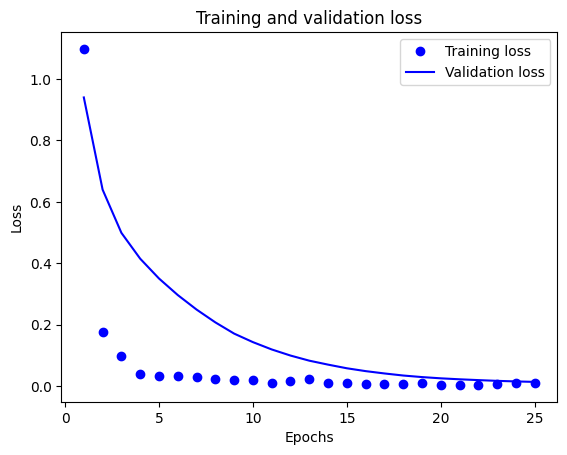

In [18]:
inputs = layers.Input(shape=(224, 224, 3))
model = EfficientNetB0(include_top=False, input_tensor=inputs, weights='imagenet')
model.trainable = False
x = layers.GlobalAveragePooling2D()(model.output)
x = layers.BatchNormalization()(x)

x = layers.Dropout(0.25)(x)
outputs = layers.Dense(5, activation='softmax')(x)

model = keras.Model(inputs=inputs, outputs=outputs, name='EfficientNetB0PreTrained')

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
history_ptr = model.fit(x=train_ds, validation_data=val_ds, epochs=25, verbose=0, callbacks=[ModelCheckpoint("butterflies_pretrained_25_epochs.keras")])

show_history_plot(history_ptr.history)

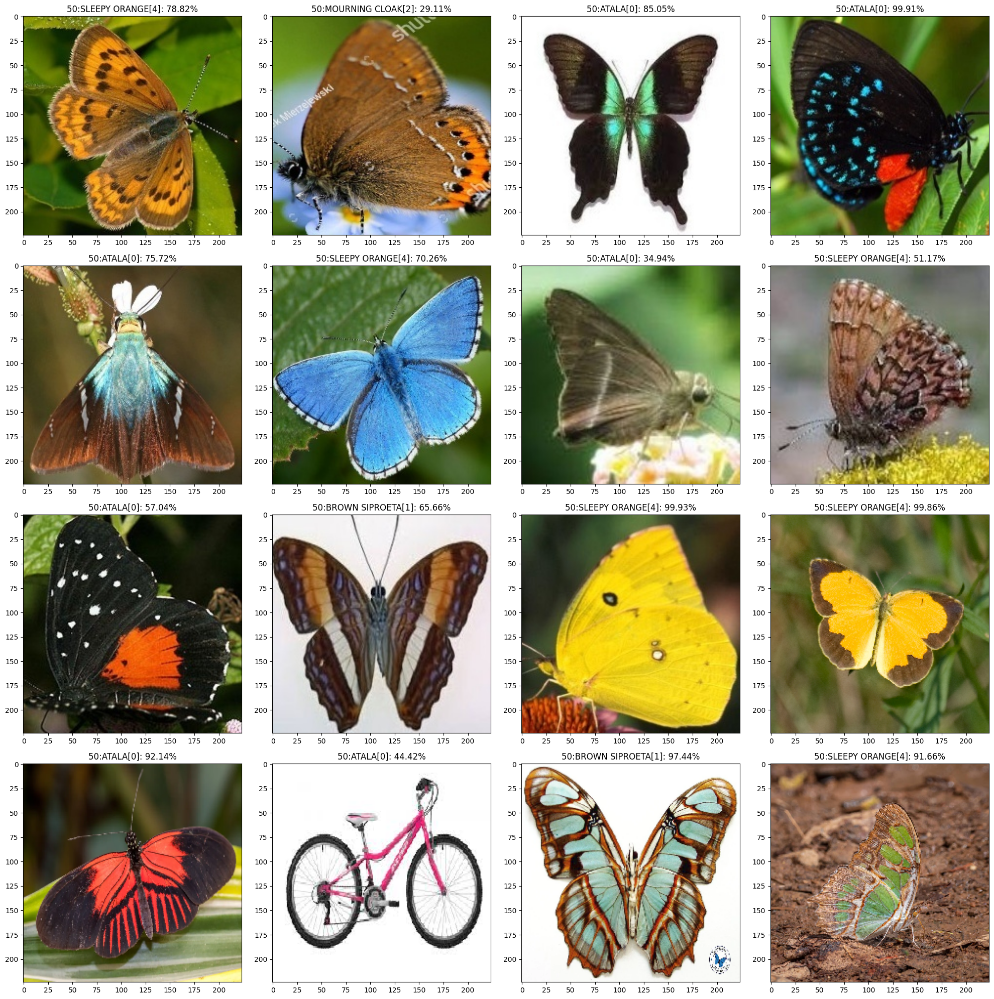

In [20]:
imgs = os.listdir('test')
_, axes = plt.subplots(math.ceil(len(imgs) / 4), 4, figsize=(20, math.ceil(len(imgs) / 4) * 5))
axes = axes.flatten()
for ind, filename in enumerate(imgs):
    img = keras.utils.load_img(f"test/{filename}", target_size=(224, 224))
    axes[ind].imshow(img)
    img_array = keras.utils.img_to_array(img)
    img_array = keras.ops.expand_dims(img_array, 0)  # Create batch axis
    predictions = model.predict(img_array, verbose=0)
    title = f"50:{df[['encoded', 'label']].drop_duplicates().sort_values('encoded')['label'].values[int(np.argmax(predictions))]}[{np.argmax(predictions)}]: {np.max(predictions) * 100:.2f}%"
    axes[ind].set_title(title)

plt.tight_layout()
plt.show()